# **Smart Anti Covid Room**

The objective is trying to estimate the social distancing among a set of people, with a non-bird-eye camera.

Several different models for object detection, downloaded from https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md, are compared to estimate which one is the best for using it in a real application of the system.

The main reference for this project is described at this page: https://medium.com/@birla.deepak26/social-distancing-ai-using-python-deep-learning-c26b20c9aa4c .

In [ ]:
!wget http://bias.csr.unibo.it/VR/Esercitazioni/MaterialeEsObjectDetection.zip

!unzip MaterialeEsObjectDetection.zip

!rm MaterialeEsObjectDetection.zip

## Imports

In [1]:
from keras import backend as K
from keras.models import load_model
from keras.preprocessing import image

from models.keras_ssd300 import ssd_300
from keras_loss_function.keras_ssd_loss import SSDLoss

from ssd_encoder_decoder.ssd_input_encoder import SSDInputEncoder

import numpy as np
import matplotlib.pyplot as plt
import random
import math
import tensorflow as tf
from tensorflow import keras
from tensorflow.python.platform import gfile
from keras.models import Model
import glob
from PIL import Image
import xml.etree.ElementTree as ET
import cv2
import itertools as iter

from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import classification_report

import time
import pandas as pd

# Test set
---

To compare the models on a simulated real application a custom dataset has been created.

Before launching the following cells make sure to have downloaded the dataset from: https://drive.google.com/file/d/1D5gm0bsWHnpF84KjlqlOSlFlNNtttuRm/view?usp=sharing

In [2]:
def load_label(label_path):
    bboxes = []
    with open(label_path, 'r') as label_file:
        for l in label_file:
            l = l.rstrip().lstrip("[").rstrip("]").split()
            bbox = np.asarray(l).astype(int)
            bboxes.append(bbox)
    return np.asarray(bboxes)

def load_data(images_folder_path, labels_folder_path):
    image_list=[]
    label_list=[]
    images_path_list=sorted(glob.glob(images_folder_path+'/*'))
    labels_path_list=sorted(glob.glob(labels_folder_path+'/*'))
    for image_path, label_path in zip(images_path_list, labels_path_list):
        image = Image.open(image_path)
        image_list.append(np.asarray(image)[:,:,:3])
        label_list.append(load_label(label_path))
    
    return np.asarray(image_list), np.asarray(label_list)

In [3]:
test_images_path = "testset/frames"
label_images_path = "testset/labels"
test_set, labels = load_data(test_images_path, label_images_path)
violation_labels = [l[-1:][0][0] for l in labels]
test_set_size = test_set.shape[0]
print("Number of images in the testset: ", test_set_size)

/public.hpc/marta.spadoni2/venv/lib/python3.7/site-packages/ipykernel_launcher.py:8: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  


Number of images in the testset:  163


/public.hpc/marta.spadoni2/venv/lib/python3.7/site-packages/ipykernel_launcher.py:20: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


## Visualizing  testset images

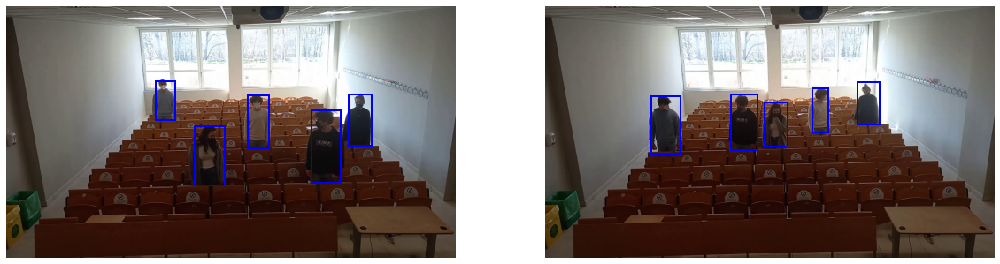

In [74]:
_, axs = plt.subplots(1, 2,figsize=(20, 10))
for i in range(2):
    random_idx=random.randint(0,test_set_size)
    axs[i].imshow(test_set[random_idx])
    axs[i].axis('off')
    for box in labels[random_idx][:-1]:
        xmin = box[0]
        ymin = box[1]
        xmax = box[2]
        ymax = box[3]
        axs[i].add_patch(plt.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, color='blue', fill=False, linewidth=2))  

# Models 
---

The following cells allow to download several networks from Tensoflow2 Model Zoo.
These are then added to a list of models: this will be used to perform inference and the subsequent performance evaluation.


In [6]:
def add_model(model_name, short_model_name, models_list):
    model = tf.saved_model.load(model_name+"/saved_model")
    model_dict = {
        'model_name' : model_name,
        'short_name': short_model_name,
        'model' : model
    }
    models_list.append(model_dict)
    return models_list

In [7]:
models_list = []

## Load SSD-MobileNetV2 FPNlite model

---

This model has been trained on the COCO dataset a standard dataset for object detection.

Inference Speed: 22ms 
COCO mAP: 22.2

In [ ]:
!wget "http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz"
!tar -xvzf ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
!rm ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz

In [8]:
models_list = add_model("ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8", "ssd_mobilenetV2_fpnlite", models_list)

2022-03-31 10:32:16.595062: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-31 10:32:16.617918: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-31 10:32:16.618521: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-31 10:32:16.619742: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

## Load CenterNet Resnet50 v2 model
---
This model has been trained on the COCO dataset a standard dataset for object detection. 

Inference Speed: 27ms COCO mAP: 29.5

In [ ]:
!wget "http://download.tensorflow.org/models/object_detection/tf2/20200711/centernet_resnet50_v2_512x512_coco17_tpu-8.tar.gz"
!tar -xvzf centernet_resnet50_v2_512x512_coco17_tpu-8.tar.gz
!rm centernet_resnet50_v2_512x512_coco17_tpu-8.tar.gz

In [9]:
models_list = add_model("centernet_resnet50_v2_512x512_coco17_tpu-8", "cn_resnet50V2", models_list)

## Load CenterNet Resnet50 v1 FPN model
---
This model has been trained on the COCO dataset a standard dataset for object detection. 

Inference Speed: 27ms COCO mAP: 31.2

In [ ]:
!wget "http://download.tensorflow.org/models/object_detection/tf2/20200711/centernet_resnet50_v1_fpn_512x512_coco17_tpu-8.tar.gz"
!tar -xvzf centernet_resnet50_v1_fpn_512x512_coco17_tpu-8.tar.gz
!rm centernet_resnet50_v1_fpn_512x512_coco17_tpu-8.tar.gz

In [10]:
models_list = add_model("centernet_resnet50_v1_fpn_512x512_coco17_tpu-8", "cn_resnet50V1_fpn", models_list)

## Load SSD MobileNet v2 model
---
This model has been trained on the COCO dataset a standard dataset for object detection. 

Inference Speed: 19ms COCO mAP: 20.2

In [ ]:
!wget "http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz"
!tar -xvzf ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz
!rm ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz

In [11]:
models_list = add_model("ssd_mobilenet_v2_320x320_coco17_tpu-8", "ssd_mobilenetV2", models_list)

## EfficientDet D0 model
---
This model has been trained on the COCO dataset a standard dataset for object detection.

Inference Speed: 39ms COCO mAP: 33.6

In [ ]:
!wget "http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz"
!tar -xvzf efficientdet_d0_coco17_tpu-32.tar.gz
!rm efficientdet_d0_coco17_tpu-32.tar.gz

In [12]:
models_list = add_model("efficientdet_d0_coco17_tpu-32", "efficientdet_d0", models_list)

## CenterNet Resnet101 V1 FPN model

This model has been trained on the COCO dataset a standard dataset for object detection.

Inference Speed: 34ms COCO mAP: 34.2


In [ ]:
!wget "http://download.tensorflow.org/models/object_detection/tf2/20200711/centernet_resnet101_v1_fpn_512x512_coco17_tpu-8.tar.gz"
!tar -xvzf centernet_resnet101_v1_fpn_512x512_coco17_tpu-8.tar.gz
!rm centernet_resnet101_v1_fpn_512x512_coco17_tpu-8.tar.gz

In [13]:
models_list = add_model("centernet_resnet101_v1_fpn_512x512_coco17_tpu-8", "cn_resnet101V1_fpn", models_list)

# SSD300 model
This model has been trained on the PASCAL VOC 2007 e 2012 dataset another dataset for object detection.

In [14]:
img_height = 300 # Altezza dell'immagine di input del modello
img_width = 300 # Larghezza dell'immagine di input del modello
img_channels = 3 # Numero di canali dell'immagine di input del modello
n_classes = 20 # Numero di classi del problema (indice classe person: 15)
scales = [0.1, 0.2, 0.37, 0.54, 0.71, 0.88, 1.05] # Fattori di scala delle default box
aspect_ratios = [[1.0, 2.0, 0.5], # Aspect ratio delle default box per ogni predictor layer
                 [1.0, 2.0, 0.5, 3.0, 1.0/3.0],
                 [1.0, 2.0, 0.5, 3.0, 1.0/3.0],
                 [1.0, 2.0, 0.5, 3.0, 1.0/3.0],
                 [1.0, 2.0, 0.5],
                 [1.0, 2.0, 0.5]] 
steps = [8, 16, 32, 64, 100, 300] # Distanza tra default box adiacenti per ogni predictor layer
offsets = [0.5, 0.5, 0.5, 0.5, 0.5, 0.5] # Offset del centro della prima default box rispetto al bordo dell'immagine riportato come frazione dello step per ogni prediction layer 
# File dei pesi dell'intera SSD-300 addestrata su Pascal VOC 2007+2012 con 120000 iterazioni
weights_path = 'weights/VGG_VOC0712_SSD_300x300_iter_120000.h5'
mean_color = [127.5,127.5,127.5] # Valore medio delle immagini utilizzate per addestrare l'intera SSD-300

# Modelli creati in precedenza vengono cancellati
K.clear_session()

model = ssd_300(image_size=(img_height, img_width, img_channels),
                n_classes=n_classes,
                mode='inference',
                scales=scales,
                aspect_ratios_per_layer=aspect_ratios,
                steps=steps,
                offsets=offsets,
                subtract_mean=mean_color)
                
# Caricamento dei pesi iniziali della rete
model.load_weights(weights_path, by_name=True)
models_list.append({'model_name':'ssd300', 'short_name': 'ssd300', 'model':model})

Instructions for updating:
Use fn_output_signature instead


Instructions for updating:
Use fn_output_signature instead


In [46]:
print("Number of models:", len(models_list))

Number of models: 7


# Utility functions

In [16]:
def resize_box(box, h, w):
    return tuple(np.array([box[0]*h, box[1]*w, box[2]*h, box[3]*w]).astype(int))

def show_img_with_boxes(image, boxes, color, title, _axs=None):
    axs = _axs
    if axs is None:
        _, axs = plt.subplots(1, 1,figsize=(20, 10))
    axs.imshow(image)
    axs.set_title(title)
    axs.axis('off')
    for box in boxes:
        xmin = box[0]
        ymin = box[1]
        xmax = box[2]
        ymax = box[3]
        axs.add_patch(plt.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, color=color, fill=False, linewidth=2))

def show_img(image, title, _axs = None):
    axs = _axs
    if axs is None:
        _, axs = plt.subplots(1, 1,figsize=(20, 10))
    axs.imshow(image)
    axs.axis('off')
    axs.set_title(title)

# Detection functions

In [24]:
def detect(model, _image, CONF_THR = 0.50):
    image = _image[np.newaxis, ...].copy()
    h,w,_ = _image.shape
    results = model(image)
    result = {key:value.numpy() for key,value in results.items()}
    classes = result["detection_classes"].astype(int)
    scores = result["detection_scores"]
    mask = np.logical_and(scores >= CONF_THR, classes == 1)
    scores = scores[mask]
    boxes = result["detection_boxes"][mask]
    boxes = [resize_box(box, h, w) for box in boxes]
    classes = classes[mask]
    return boxes, scores, classes

def decode_boxes(boxes):
    return [[b[1], b[0], b[3], b[2]] for b in boxes]
    
def predict(model, images, conf_thr = 0.50):
    boxes = []
    scores = []
    classes = []
    for image in images:
        b, s, c = detect(model, image, conf_thr)
        boxes.append(decode_boxes(b))
        scores.append(s)
        classes.append(c)
    return boxes, scores, classes

#Functions used for ssd300 inference
def ssd300_predict(model, test_set, confidence_thr):
    boxes = []
    scores = []
    classes = []
    for img in test_set:
        img_res = cv2.resize(img, (300,300), interpolation = cv2.INTER_AREA)
        pb, ps, pc = select_preds(model.predict(img_res[np.newaxis,:,:,:]), img.shape, confidence_thr, selected_class = 15)
        boxes.append(pb)
        scores.append(ps)
        classes.append(pc)
    return boxes, scores, classes

def select_preds(y_pred,output_image_shape,confidence_threshold=0.4, selected_class = -1):
    y_pred_thresh = [y_pred[k][y_pred[k,:,1] > confidence_threshold] for k in range(y_pred.shape[0])]

    pred_boxes = []
    pred_labels = []
    pred_scores = []
    for box in y_pred_thresh[0]:
        xmin = int(box[2] * output_image_shape[1] / img_width)
        ymin = int(box[3] * output_image_shape[0] / img_height)
        xmax = int(box[4] * output_image_shape[1] / img_width)
        ymax = int(box[5] * output_image_shape[0] / img_height)
        class_id = int(box[0])
        score = box[1]
        if selected_class == -1 or selected_class == class_id:
            pred_boxes.append([xmin, ymin, xmax, ymax])
            pred_scores.append(score)
            pred_labels.append(class_id)
                

    return pred_boxes, pred_scores, pred_labels

# Human Detection performance evaluation functions

In [18]:
def area(rect):
    return (rect[0] - rect[2]) * (rect[1] - rect[3])

def iou(label_box, pred_box):
    pred_area = area(pred_box)
    label_area = area(label_box)

    ix = min(label_box[3], pred_box[3]) - max(label_box[1], pred_box[1])
    iy = min(label_box[2], pred_box[2]) - max(label_box[0], pred_box[0])

    ix = max(ix, 0)
    iy = max(iy, 0)

    intersection = ix * iy

    union_area = pred_area + label_area - intersection
    union_area = max(union_area, np.finfo(float).eps)

    return intersection / union_area

def compute_tp_fp(_bboxes, labels, IOU_THR = 0.5):
    bboxes = _bboxes.copy()
    tp = []
    fp = []
    for gt_bbox in labels:
        overlaps = []
        for bbox in bboxes:
            overlaps.append(iou(gt_bbox, bbox))
        if sum(overlaps) != 0:
            max_index = np.argmax(np.array(overlaps))
            #print("max overlap con: ", bboxes[max_index])
            if overlaps[max_index] >= IOU_THR:
                tp.append(1)
                fp.append(0)
                bboxes.pop(max_index)
            else:
                tp.append(0)
                fp.append(1)
        else:
            tp.append(0)
            fp.append(0)
    return np.asarray(tp), np.asarray(fp)
    
def compute_class_tp_fp(boxes, labels):
    tp = []
    fp = []
    num_annotations = 0
    for b, l in zip(boxes, labels):
        lb = l[:-1]
        ftp, ffp = compute_tp_fp(b, lb)
        tp.extend(ftp)
        fp.extend(ffp)
        num_annotations = num_annotations + len(lb)
    return tp, fp, num_annotations

def compute_ap(recall, precision):
    mrec = np.concatenate(([0.], recall, [1.]))
    mpre = np.concatenate(([0.], precision, [0.]))

    for i in range(mpre.size - 1, 0, -1):
        mpre[i - 1] = np.maximum(mpre[i - 1], mpre[i])

    i = np.where(mrec[1:] != mrec[:-1])[0]
    ap = np.sum((mrec[i + 1] - mrec[i]) * mpre[i + 1])
    return ap

def compute_class_average_precision(true_positives,false_positives,num_annotations):
    if num_annotations == 0:
        return 0
    
    false_positives = np.cumsum(false_positives)
    true_positives = np.cumsum(true_positives)

    recall = true_positives / num_annotations

    precision = true_positives / np.maximum(true_positives + false_positives, np.finfo(np.float64).eps)

    return compute_ap(recall, precision)


## Perspective Matrix

In order to checking the social distancing, the system needs a perspective matrix that allow to transform each frame in its corrisponding in the bird view.

Given an image of the empty room in which the social distancing must be checked, using the provided Python Script "sd-matrix.py" is possibile to compute the matrix.

In the cell below a pre-calculated matrix will be load.

In [19]:
matrix = np.load("perspective_matrix.npy")
print(matrix)
bird_eye_frame = np.asarray(Image.open("bird_eye_frame.png"))[:,:,:3]

[[-6.88414613e+00 -7.26135962e+00  3.18990585e+03]
 [-2.92120913e-01 -1.28046334e+01  2.27226252e+03]
 [-4.05777507e-04 -1.81039292e-02  1.00000000e+00]]


The following cell shows the bird-eye view of the room

Text(0.5, 1.0, 'Bird-eye View')

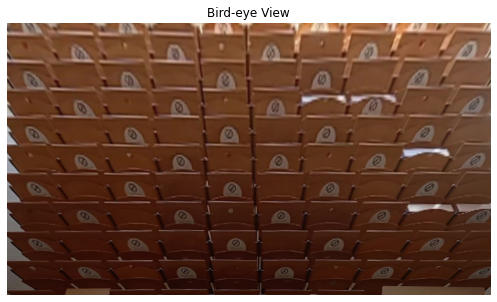

In [20]:
_, axs = plt.subplots(1, 1,figsize=(10, 5))
axs.imshow(bird_eye_frame)
axs.axis('off')
axs.set_title('Bird-eye View')

# Persective functions

In [21]:
def compute_perspective_matrix(upper_left, upper_right, bottom_left, bottom_right, image):
    corners = np.float32([upper_left, upper_right, bottom_left, bottom_right])
    h, w = TARGET_H, TARGET_W
    params = np.float32([[0, 0], [w, 0], [0, h], [w, h]])

    matrix = cv2.getPerspectiveTransform(corners, params)
    transformation = cv2.warpPerspective(image, matrix, (w,h))
    return matrix, transformation

def perspective_transform(matrix, image):
    h, w = TARGET_H, TARGET_W
    return cv2.warpPerspective(image, matrix, (w,h))

def get_bbox_centroid(box):
    y1, x1, y2, x2 = box[1], box[0], box[3], box[2]
    #return [(x1+x2)/2, (y1+y2)/2]
    return ((x1+x2)/2, y2)
  
def map_centroid(centroid, matrix):
    return cv2.perspectiveTransform(centroid, matrix)

def compute_bbox_centroids(detection_boxes):
    return [get_bbox_centroid(box) for box in detection_boxes]
  

def compute_bird_eye_centroids(detection_boxes, matrix):
    detection_centroids = compute_bbox_centroids(detection_boxes)
    mapped_centroids = [map_centroid(np.array([np.array([centroid])]), matrix) for centroid in detection_centroids]
    mapped_centroids = [(int(centroid[0][0][0]), int(centroid[0][0][1])) for centroid in mapped_centroids]
    return mapped_centroids


# Social Distancing functions

In [22]:
def compute_safe_distance_in_px(real_width, target_width, SAFE_DISTANCE_THR_METER = 1):
    safe_distance = (target_width * SAFE_DISTANCE_THR_METER)/real_width
    return safe_distance
    #return 110

def distance_between(p1, p2):
    return math.sqrt((p1[0]-p2[0])**2 + (p1[1]-p2[1])**2)

def check_centroids_distancing(frame_centroids, real_width, target_width = 800):
    checked_centroids = []
    mask = []
    couples = [couple for couple in iter.combinations(frame_centroids, 2)]
    for couple in couples:
        distance = distance_between(couple[0], couple[1])
        violation = distance <= compute_safe_distance_in_px(real_width, target_width)
        #print("Couple: ", couple, "Violate Social distancing: ", violation)
        checked_centroids.append((couple, violation))
        mask.append(violation)

    return checked_centroids, mask

def check_boxes_distancing(frame_boxes, mask):
    checked_boxes = []
    red = []
    couples = [couple for couple in iter.combinations(frame_boxes, 2)]
    for i, couple in enumerate(couples):
        if mask[i]:
            red.append([couple[0][0], couple[0][1], couple[0][2], couple[0][3]])
            red.append([couple[1][0], couple[1][1], couple[1][2], couple[1][3]])
    for b in frame_boxes:
        checked_boxes.append((b, (255, 0, 0) if b in red else (0, 255, 0)))
    return checked_boxes

In [23]:
def draw_checked_boxes_on_frame(frame, checked_boxes):
    _img = frame.copy()
    for b in checked_boxes:
        start_point = (b[0][0], b[0][1])
        end_point = (b[0][2], b[0][3])
        cv2.rectangle(_img, start_point, end_point, b[1], 1)
    return _img

# Social Distancing Verification - Perfomance Evaluation

In [41]:
def evaluate_model_speed(model_dict, matrix, confidence_thr):
    model = model_dict['model']
    frame_number = 50
    start_time = time.time()
    bbox, s, c = predict(model, test_set[0:frame_number], confidence_thr) if model_dict['model_name'] != 'ssd300' else ssd300_predict(model, test_set[0:frame_number], confidence_thr)
    detection_speed = (time.time() - start_time)/frame_number
    model_dict['detection_speed'] = detection_speed
    for i in range(frame_number):
        frame_be_centroids = compute_bird_eye_centroids(bbox[i], matrix)
        cc, mask = check_centroids_distancing(frame_be_centroids, 9, target_width = test_set[0].shape[1])
        violation = any(mask)

    execution_speed = (time.time() - start_time)/frame_number
    model_dict['execution_speed'] = execution_speed
    model_dict['fps'] = round(1 / execution_speed)
    return model_dict

def evaluate_model_ap(model_dict, test_set, labels, confidence_thr):
    model = model_dict['model']
    boxes, scores, classes = predict(model, test_set, confidence_thr) if model_dict['model_name'] != 'ssd300' else ssd300_predict(model, test_set, confidence_thr)
    tp, fp, num_annotations = compute_class_tp_fp(boxes, labels)
    ap = compute_class_average_precision(tp, fp, num_annotations)
    model_dict['ap'] = ap
    return model_dict

def decode_violation_predictions(preds):
    return [1-int(p) for p in preds]


def model_predictions(model_dict, test_set, matrix, confidence_thr):
    model = model_dict['model']
    violation = []
    masks = []
    boxes, scores, classes = predict(model, test_set, confidence_thr) if model_dict['model_name'] != 'ssd300' else ssd300_predict(model, test_set, confidence_thr)
    for bbox in boxes:
        frame_be_centroids = compute_bird_eye_centroids(bbox, matrix)
        cc, mask = check_centroids_distancing(frame_be_centroids, 9, target_width = test_set[0].shape[1])
        violation.append(any(mask))
        masks.append(mask)
    preds = decode_violation_predictions(violation)
    model_dict['boxes'] = boxes
    model_dict['predictions'] = preds
    model_dict['masks'] = masks
    return model_dict

In [48]:
def show_model_human_detections(model_dict, test_set, labels, random_idx):
    boxes = model_dict['boxes']
    model = model_dict["model_name"]
    fig, axs = plt.subplots(1, 2,figsize=(20, 10))
    show_img_with_boxes(test_set[random_idx], labels[random_idx][:-1], 'green', 'Ground Truth: ' + str(random_idx) , axs[0])
    show_img_with_boxes(test_set[random_idx], boxes[random_idx], 'blue', 'Prediction: '+str(random_idx), axs[1])
    fig.suptitle('Model: ' + model, fontsize=16, y=0.8)
    plt.tight_layout()
    plt.show()

def model_fp(model_preds, labels):
    fp = []
    for i in range(test_set_size):
        if model_preds[i] == 1 and labels[i] == 0:
            fp.append(i)
    return fp

def model_fn(model_preds, labels):
    fn = []
    for i in range(test_set_size):
        if model_preds[i] == 0 and labels[i] == 1:
            fn.append(i)
    return fn

def show_model_fp_fn(model_dict, test_set, violation_labels):
    boxes = model_dict['boxes']
    masks = model_dict['masks']
    model = model_dict["model_name"]
    fig, axs = plt.subplots(1, 2,figsize=(20, 10))
    fp = model_fp(model_dict['predictions'], violation_labels)
    fn = model_fn(model_dict['predictions'], violation_labels)
    
    idx_fp = random.choice(fp)
    idx_fn = random.choice(fn)
    
    fp_frame = test_set[idx_fp]
    cb = check_boxes_distancing(boxes[idx_fp], masks[idx_fp])
    fp_frame = draw_checked_boxes_on_frame(fp_frame, cb)
    
    fn_frame = test_set[idx_fn]
    cb = check_boxes_distancing(boxes[idx_fn], masks[idx_fn])
    fn_frame = draw_checked_boxes_on_frame(fn_frame, cb)
 
    show_img(fp_frame, 'False Positive: ' + str(idx_fp), axs[0])
    show_img(fn_frame, 'False Negative: ' + str(idx_fn), axs[1])
    
    fig.suptitle('Model: ' + model, fontsize=16, y=0.8)
    plt.tight_layout()
    plt.show()

In [29]:
matrix = np.load("perspective_matrix.npy")
confidence_thr = 0.45
for model_dict in models_list:
    print("Evaluating model:", model_dict['short_name'])
    model_dict = evaluate_model_speed(model_dict, matrix, confidence_thr)
    model_dict = evaluate_model_ap(model_dict, test_set, labels, confidence_thr)
    model_dict = model_predictions(model_dict, test_set, matrix, confidence_thr)

Evaluating model: ssd_mobilenetV2_fpnlite
Evaluating model: cn_resnet50V2


2022-03-31 10:40:06.191298: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: StatefulPartitionedCall/Assert/AssertGuard/branch_executed/_336


Evaluating model: cn_resnet50V1_fpn


2022-03-31 10:40:17.667469: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: StatefulPartitionedCall/Assert/AssertGuard/branch_executed/_378


Evaluating model: ssd_mobilenetV2
Evaluating model: efficientdet_d0
Evaluating model: cn_resnet101V1_fpn


2022-03-31 10:42:14.351787: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: StatefulPartitionedCall/Assert/AssertGuard/branch_executed/_684


Evaluating model: ssd300


In [40]:
df = pd.DataFrame(models_list).sort_values(by=['execution_speed'])
print(df[['short_name', 'detection_speed', 'execution_speed', 'fps']].to_markdown(index=False))

| short_name              |   detection_speed |   execution_speed |   fps |
|:------------------------|------------------:|------------------:|------:|
| cn_resnet50V1_fpn       |         0.0438188 |         0.0438496 |    23 |
| cn_resnet50V2           |         0.0555336 |         0.0555633 |    18 |
| cn_resnet101V1_fpn      |         0.0571568 |         0.0571863 |    17 |
| ssd300                  |         0.0897187 |         0.0897409 |    11 |
| ssd_mobilenetV2_fpnlite |         0.102447  |         0.102477  |    10 |
| ssd_mobilenetV2         |         0.116552  |         0.116584  |     9 |
| efficientdet_d0         |         0.296755  |         0.296787  |     3 |


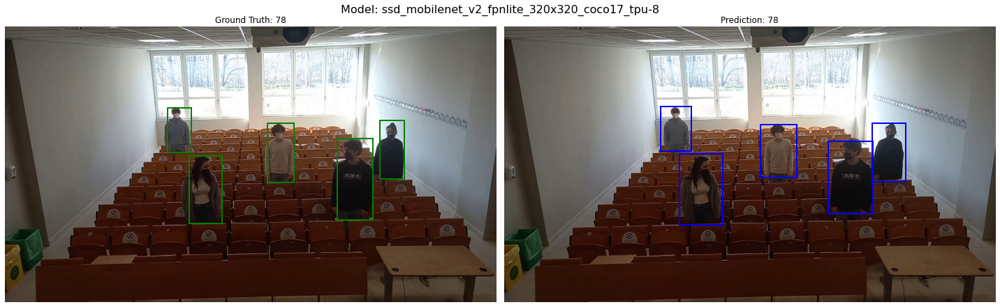

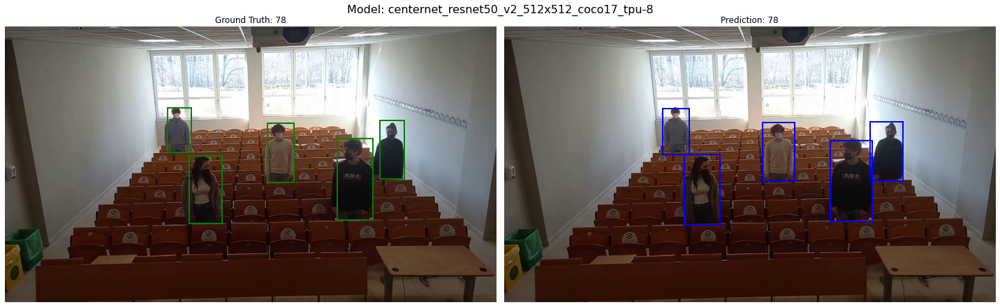

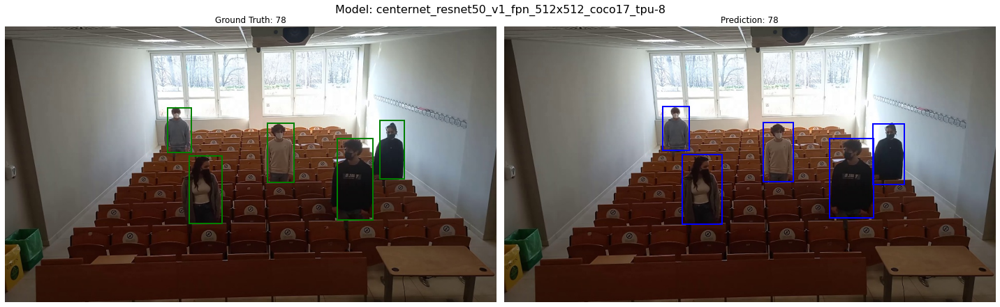

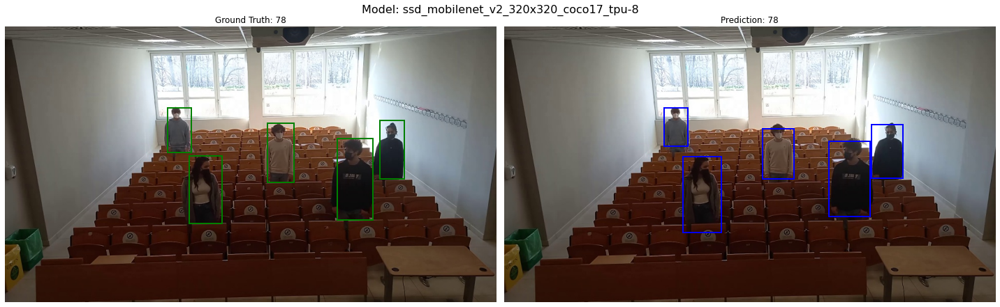

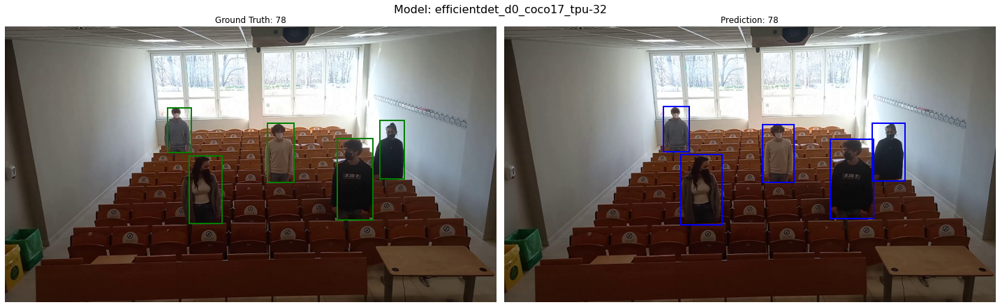

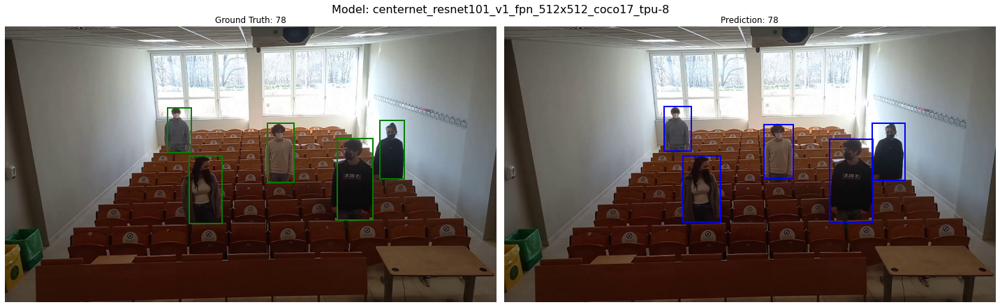

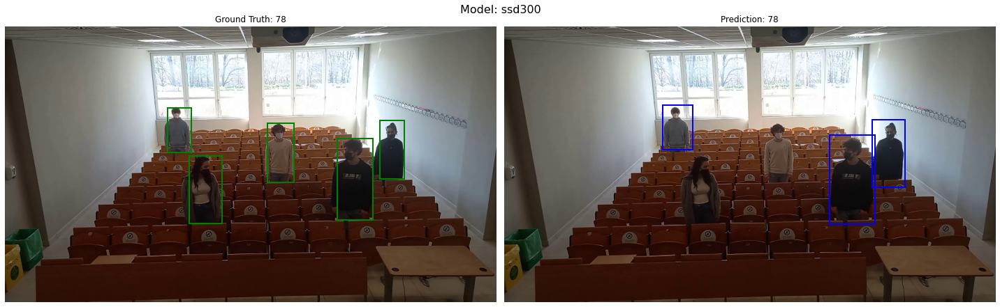

In [55]:
random_idx=random.randint(0,test_set_size)
for model_dict in models_list:
    show_model_human_detections(model_dict, test_set, labels, random_idx)

In [35]:
df = pd.DataFrame(models_list).sort_values(by=['ap'], ascending=False)
print(df[['short_name', 'ap']].to_markdown(index=False))

| short_name              |       ap |
|:------------------------|---------:|
| cn_resnet101V1_fpn      | 0.921227 |
| cn_resnet50V1_fpn       | 0.913972 |
| efficientdet_d0         | 0.907447 |
| cn_resnet50V2           | 0.853472 |
| ssd_mobilenetV2_fpnlite | 0.788238 |
| ssd_mobilenetV2         | 0.654942 |
| ssd300                  | 0.443307 |


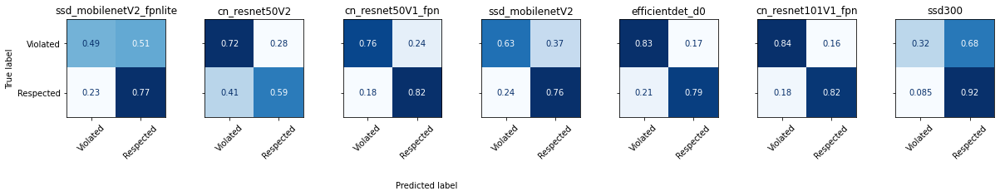

In [36]:
class_names = ["Violated", "Respected"]
f, axes = plt.subplots(1, 7, figsize=(20, 5), sharey='row')

for i, model_dict in enumerate(models_list):
    cf_matrix = confusion_matrix(violation_labels, model_dict['predictions'], normalize="true")
    tn, fp, fn, tp = confusion_matrix(violation_labels, model_dict['predictions']).ravel()
    model_dict['errors'] = fp+tp
    disp = ConfusionMatrixDisplay(cf_matrix, display_labels=class_names)
    disp.plot(ax=axes[i], xticks_rotation=45, cmap="Blues")
    disp.ax_.set_title(model_dict['short_name'])
    disp.im_.colorbar.remove()
    disp.ax_.set_xlabel('')
    if i!=0:
        disp.ax_.set_ylabel('')

f.text(0.4, 0.1, 'Predicted label', ha='left')
plt.subplots_adjust(wspace=0.40, hspace=0.1)


#f.colorbar(disp.im_, ax=axes)
plt.show()


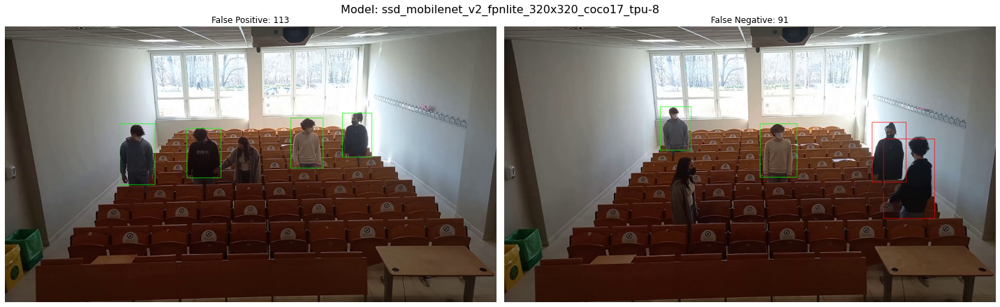

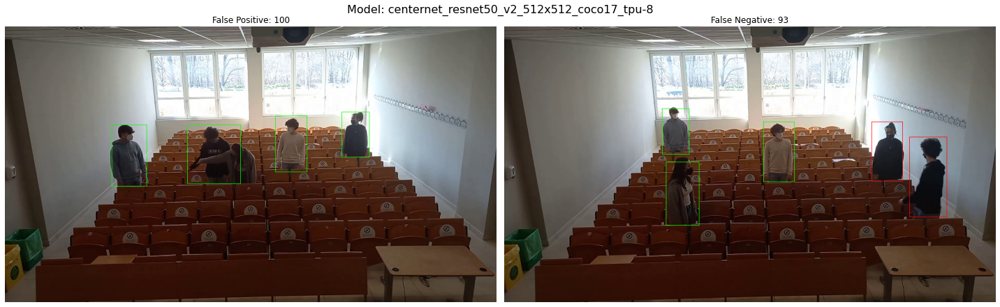

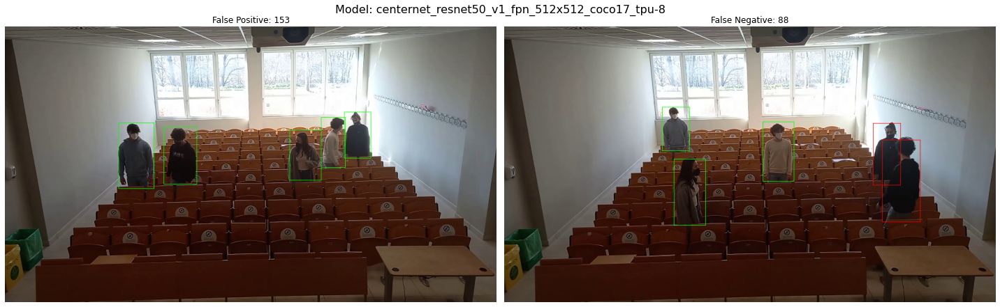

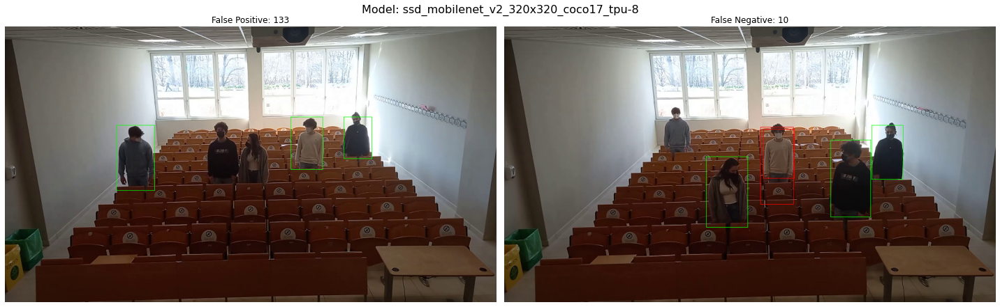

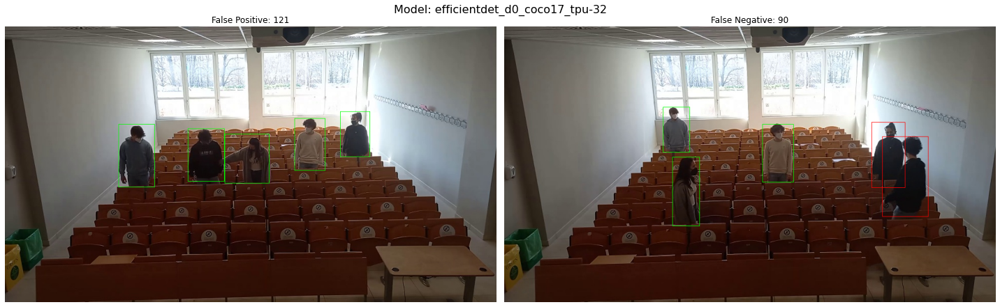

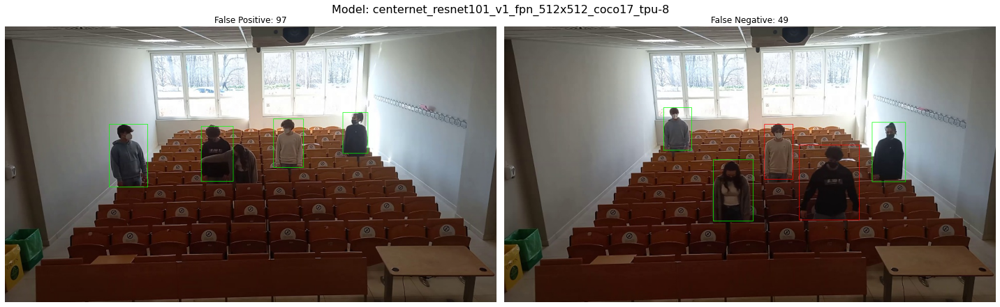

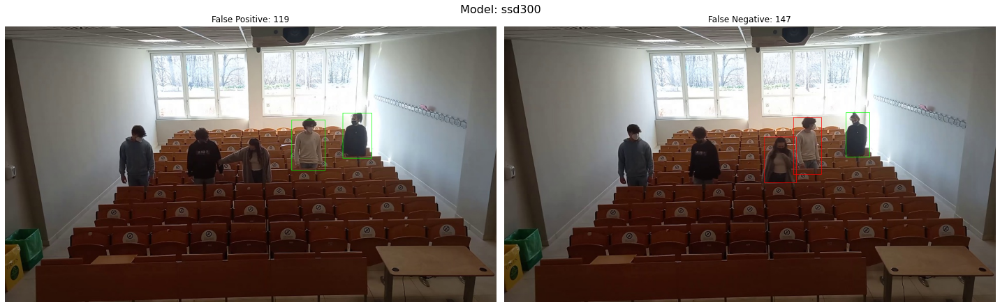

In [37]:
for model_dict in models_list:
    show_model_fp_fn(model_dict, test_set, violation_labels)

# Models Rank
----
The models are sorted by fps, average precision and number of errors. 

In [73]:
df = pd.DataFrame(models_list).sort_values(by=['fps', 'ap', 'errors'], ascending=[False, False, True])
print(df[['short_name', 'fps', 'ap', 'errors']].to_markdown(index=False))

| short_name              |   fps |       ap |   errors |
|:------------------------|------:|---------:|---------:|
| cn_resnet50V1_fpn       |    23 | 0.913972 |       80 |
| cn_resnet50V2           |    18 | 0.853472 |       68 |
| cn_resnet101V1_fpn      |    17 | 0.921227 |       73 |
| ssd300                  |    11 | 0.443307 |      128 |
| ssd_mobilenetV2_fpnlite |    10 | 0.788238 |      102 |
| ssd_mobilenetV2         |     9 | 0.654942 |       88 |
| efficientdet_d0         |     3 | 0.907447 |       72 |
